In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
import datetime as dt

In [2]:
police_data = pd.read_csv('../data/police_big_data.csv')

In [3]:
derecho_calls = gpd.read_file('../data/911_Phone Calls_Derecho_050320 050420.csv')

In [4]:
print(police_data.info())
print(police_data.shape)
police_data.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936446 entries, 0 to 936445
Data columns (total 31 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Primary Key                  936446 non-null  object 
 1   Incident Number              936446 non-null  int64  
 2   Report Type                  936354 non-null  object 
 3   Report Type Description      871039 non-null  object 
 4   Incident Status Code         936410 non-null  object 
 5   Incident Status Description  936410 non-null  object 
 6   Investigation Status         936446 non-null  object 
 7   Incident Occurred            936446 non-null  object 
 8   Incident Reported            936434 non-null  object 
 9   Incident Location            934070 non-null  object 
 10  Latitude                     906854 non-null  float64
 11  Longitude                    906854 non-null  float64
 12  ZIP Code                     528811 non-null  float64
 13 

,Primary Key,Incident Number,Report Type,Report Type Description,Incident Status Code,Incident Status Description,Investigation Status,Incident Occurred,Incident Reported,Incident Location,...,Weapon Description,Victim Number,Domestic Related,Victim Type,Victim Description,Victim Gender,Victim Race,Victim Ethnicity,Victim County Resident,Mapped Location
0,20140395371_11,20140395371,D,DISPATCHED,O,OPEN,Open,04/21/2014 10:00:00 AM,04/25/2014 03:57:00 PM,1300 ANTIOCH PIKE,...,NONE,1,False,B,BUSINESS,NaN,NaN,NaN,NaN,NaN
1,20200601877_11,20200601877,T,NaN,O,OPEN,Open,09/08/2020 03:37:00 PM,09/19/2020 12:35:00 PM,ABBOTT MARTIN RD,...,NONE,1,False,B,BUSINESS,NaN,NaN,NaN,NaN,POINT (-86.82 36.11)



data_30_day_b4 = []

for f in police_data['Incident Occurred']:
    if f >= '04/3/2020 12:00:01 AM' and f <= '05/2/2020 12:00:01 AM':
        data_30_day_b4.append(True)
    else:
        data_30_day_b4.append(False)
    

thirty_day_after = []

for f in police_data['Incident Occurred']:
    if f >= '05/4/2020 12:00:01 AM' and f <= '06/4/2020 12:00:01 AM':
        thirty_day_after.append(True)
    else:
        thirty_day_after.append(False)

In [5]:
police_data['Incident Occurred'] = pd.to_datetime(police_data['Incident Occurred'],
                                                           format= '%m/%d/%Y %I:%M:%S %p')


In [6]:
before = police_data[(police_data['Incident Occurred'] >= '04/26/2020') &
                                              (police_data['Incident Occurred'] <= '05/2/2020')]

In [7]:
after = police_data[(police_data['Incident Occurred'] >= '05/4/2020') &
                                              (police_data['Incident Occurred'] <= '05/10/2020')]

In [48]:
after.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1651 entries, 233 to 936389
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Primary Key                  1651 non-null   object        
 1   Incident Number              1651 non-null   int64         
 2   Report Type                  1651 non-null   object        
 3   Report Type Description      1471 non-null   object        
 4   Incident Status Code         1651 non-null   object        
 5   Incident Status Description  1651 non-null   object        
 6   Investigation Status         1651 non-null   object        
 7   Incident Occurred            1651 non-null   datetime64[ns]
 8   Incident Reported            1651 non-null   object        
 9   Incident Location            1651 non-null   object        
 10  Latitude                     1641 non-null   float64       
 11  Longitude                    16

police_data['thirty_day_after'] = thirty_day_after

police_data['data_30_day_b4'] = data_30_day_b4

before = police_data[police_data['data_30_day_b4'] == True]
print(before.info())
print(before.shape)

after = police_data[police_data['thirty_day_after'] == True]
print(after.info())
print(after.shape)


In [8]:
print(derecho_calls.info())
print(derecho_calls.shape)
derecho_calls.head(2)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1549 entries, 0 to 1548
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Seizure DateTime    1549 non-null   object  
 1   CallTypeId          1549 non-null   object  
 2   ALI Latitude        1549 non-null   object  
 3   ALI Longitude       1549 non-null   object  
 4   Cell Tower Address  1549 non-null   object  
 5   geometry            0 non-null      geometry
dtypes: geometry(1), object(5)
memory usage: 72.7+ KB
None
(1549, 6)


,Seizure DateTime,CallTypeId,ALI Latitude,ALI Longitude,Cell Tower Address,geometry
0,5/3/2020 16:30,911 Calls,36.247802,-86.716847,WIRELESS CALLER,None
1,5/3/2020 16:30,911 Calls,36.143108,-86.800621,1161 21ST AV S - SE,None


In [9]:
derecho_dispatch = pd.read_csv('../data/AI_may.csv', skiprows = 3)
print(derecho_dispatch.info())
print(derecho_dispatch.shape)
derecho_dispatch.head(2)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 627 entries, 0 to 626
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   IncidentDate              627 non-null    object 
 1   Location                  627 non-null    object 
 2   Latitude1                 627 non-null    float64
 3   Longitude1                627 non-null    float64
 4   IncidentTypeDescription1  627 non-null    object 
dtypes: float64(2), object(3)
memory usage: 24.6+ KB
None
(627, 5)


,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD


In [10]:
zipcodes = gpd.read_file('../data/zipcodes.geojson')
zipcodes = zipcodes[['zip', 'po_name', 'geometry']]
zipcodes.head(5)

,zip,po_name,geometry
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,NASHVILLE,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,NASHVILLE,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,BRENTWOOD,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,FRANKLIN,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [11]:
before['geometry'] = before.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)

before.head(2)

<ipython-input-11-6aff9619c817>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  before['geometry'] = before.apply(lambda x: Point((float(x.Longitude),


,Primary Key,Incident Number,Report Type,Report Type Description,Incident Status Code,Incident Status Description,Investigation Status,Incident Occurred,Incident Reported,Incident Location,...,Victim Number,Domestic Related,Victim Type,Victim Description,Victim Gender,Victim Race,Victim Ethnicity,Victim County Resident,Mapped Location,geometry
457,20200532668_11,20200532668,D,DISPATCHED,O,OPEN,Open,2020-05-01 08:00:00,08/18/2020 01:22:00 PM,MCDONALD CT,...,1,False,I,INDIVIDUAL (18 AND OVER),F,W,Non-Hispanic,RESIDENT,POINT (-86.71 36.11),POINT (-86.70999999999999 36.11)
730,20200517154_11,20200517154,D,DISPATCHED,U,UNFOUNDED,Closed,2020-05-01 12:00:00,08/11/2020 02:42:00 PM,2300 ROSA L PARKS BLVD,...,1,False,I,INDIVIDUAL (18 AND OVER),F,B,Non-Hispanic,RESIDENT,POINT (-86.81 36.194),POINT (-86.81 36.194)


In [12]:
after['geometry'] = after.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)

after.head(2)

<ipython-input-12-7afb62b3e5c3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after['geometry'] = after.apply(lambda x: Point((float(x.Longitude),


,Primary Key,Incident Number,Report Type,Report Type Description,Incident Status Code,Incident Status Description,Investigation Status,Incident Occurred,Incident Reported,Incident Location,...,Victim Number,Domestic Related,Victim Type,Victim Description,Victim Gender,Victim Race,Victim Ethnicity,Victim County Resident,Mapped Location,geometry
233,20200326943_11,20200326943,D,DISPATCHED,O,OPEN,Open,2020-05-04 16:17:00,05/08/2020 03:33:00 PM,LUCAS LN,...,1,False,B,BUSINESS,NaN,NaN,NaN,NaN,POINT (-86.77 36.2),POINT (-86.77 36.2)
439,20200333656_11,20200333656,D,DISPATCHED,O,OPEN,Open,2020-05-04 09:00:00,05/11/2020 05:06:00 PM,OLIVE CIR,...,1,False,I,INDIVIDUAL (18 AND OVER),M,W,Non-Hispanic,RESIDENT,POINT (-86.66 36.09),POINT (-86.66 36.09)


In [13]:
before = gpd.GeoDataFrame(before, 
                           crs = zipcodes.crs, 
                           geometry = before['geometry'])
type(before)

geopandas.geodataframe.GeoDataFrame

In [14]:
after = gpd.GeoDataFrame(after, 
                           crs = zipcodes.crs, 
                           geometry = after['geometry'])
type(after)

geopandas.geodataframe.GeoDataFrame

In [15]:
before_geo = gpd.sjoin(before, zipcodes, op = 'within')
after_geo = gpd.sjoin(after, zipcodes, op = 'within')


In [16]:
before_geo['zip'].value_counts()

37207    184
37013    177
37211    170
37115    152
37217    112
37209    110
37208     99
37210     92
37203     88
37214     87
37076     86
37206     71
37218     48
37221     48
37216     32
37204     30
37201     29
37212     27
37138     21
37228     17
37027     17
37215     11
37205     10
37080      9
37213      8
37072      7
37189      7
37220      5
37219      3
37122      2
37135      1
37086      1
Name: zip, dtype: int64

In [17]:
after_geo['zip'].value_counts()

37207    190
37211    171
37013    169
37115    150
37209    104
37208     96
37217     83
37076     81
37210     81
37214     74
37206     59
37203     57
37218     54
37221     43
37204     32
37216     29
37212     28
37201     24
37138     24
37215     14
37228     13
37213     12
37205     12
37072      9
37027      9
37219      8
37189      7
37080      6
37220      1
Name: zip, dtype: int64

In [18]:
derecho_dispatch['geometry'] = derecho_dispatch.apply(lambda x: Point((float(x.Longitude1), 
                                                         float(x.Latitude1))), 
                                        axis=1)

derecho_dispatch.head(2)

,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD,POINT (-86.96252641 36.04687715)
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD,POINT (-86.94067952 36.08249081)


In [19]:

derecho_dispatch = gpd.GeoDataFrame(derecho_dispatch, 
                           crs = zipcodes.crs, 
                           geometry = derecho_dispatch['geometry'])
type(derecho_dispatch)

geopandas.geodataframe.GeoDataFrame

In [20]:
derecho_geo =  gpd.sjoin(derecho_dispatch, zipcodes, op = 'within')
derecho_geo.head(2)

,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry,index_right,zip,po_name
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD,POINT (-86.96253 36.04688),7,37221,NASHVILLE
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD,POINT (-86.94068 36.08249),7,37221,NASHVILLE


In [21]:
derecho_geo['zip'].value_counts()

37211    79
37076    61
37205    57
37013    56
37214    37
37215    34
37204    29
37221    27
37217    27
37210    26
37212    25
37209    25
37207    20
37203    20
37220    19
37115    15
37208    12
37216    12
37206     9
37027     8
37138     6
37218     6
37072     5
37080     3
37228     2
37143     1
37189     1
37201     1
37232     1
37219     1
Name: zip, dtype: int64

In [22]:
type(derecho_geo)

geopandas.geodataframe.GeoDataFrame

In [23]:
type(before_geo)

geopandas.geodataframe.GeoDataFrame

In [24]:
type(after_geo)

geopandas.geodataframe.GeoDataFrame

In [25]:
zipcodes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [26]:
derecho_geo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
before_geo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
after_geo.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

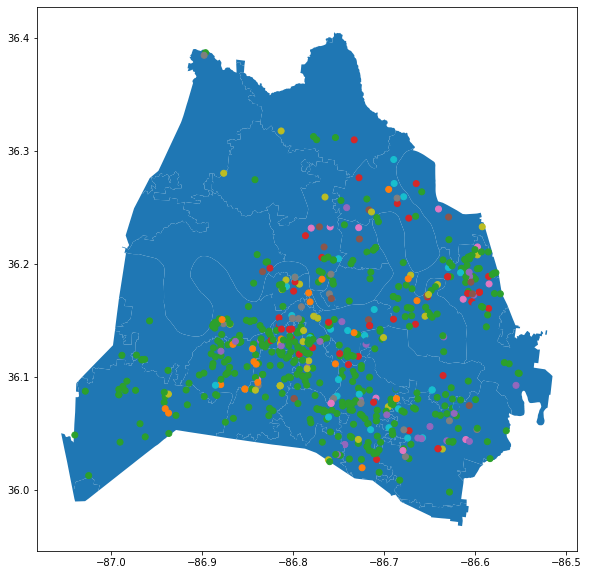

In [29]:
ax = zipcodes.plot(figsize = (10,10))
derecho_geo.plot( ax = ax, column = 'IncidentTypeDescription1')
plt.show();

In [30]:
zipcodes.geometry.centroid

<ipython-input-30-2dee0cdaba00>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zipcodes.geometry.centroid


0     POINT (-86.69477 36.25433)
1     POINT (-86.72635 36.21605)
2     POINT (-86.77467 36.10566)
3     POINT (-86.78551 36.04148)
4     POINT (-87.02866 36.00026)
5     POINT (-87.03712 36.08997)
6     POINT (-86.86263 36.38001)
7     POINT (-86.97531 36.06283)
8     POINT (-86.76433 36.33621)
9     POINT (-86.80157 36.13335)
10    POINT (-86.63653 35.98113)
11    POINT (-86.72226 36.00938)
12    POINT (-86.91816 36.15605)
13    POINT (-86.73098 36.18090)
14    POINT (-86.69470 36.00387)
15    POINT (-86.85733 36.37882)
16    POINT (-86.72570 36.00942)
17    POINT (-86.66093 36.10779)
18    POINT (-86.82996 36.27880)
19    POINT (-86.78726 36.28724)
20    POINT (-86.89487 36.32034)
21    POINT (-86.68513 35.99434)
22    POINT (-86.64118 36.25192)
23    POINT (-86.98674 36.15655)
24    POINT (-86.78317 36.16682)
25    POINT (-86.68331 35.99201)
26    POINT (-86.76289 36.39920)
27    POINT (-86.89039 36.20505)
28    POINT (-86.52221 36.13926)
29    POINT (-86.67866 35.98840)
30    POIN

In [31]:
center = zipcodes.geometry.centroid[30]
print(center)

POINT (-86.8023649074469 36.14070866972904)


<ipython-input-31-42e49939e8fa>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = zipcodes.geometry.centroid[30]


In [32]:
area_center = [center.y, center.x]
print(area_center)


[36.14070866972904, -86.8023649074469]


In [33]:
map_zips = folium.Map(location =  area_center, zoom_start = 12)
map_zips

In [34]:
i = 0
for row_index, row_values in derecho_geo.iterrows():
    if i <3: 
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 0
values are:
 
IncidentDate                             5/3/2020 4:31:07 PM
Location                                    901 KENWICK CT W
Latitude1                                            36.0469
Longitude1                                          -86.9625
IncidentTypeDescription1                   ELECTRICAL HAZARD
geometry                    POINT (-86.96252641 36.04687715)
index_right                                                7
zip                                                    37221
po_name                                            NASHVILLE
Name: 0, dtype: object
------------------------- 
index is 1
values are:
 
IncidentDate                             5/3/2020 4:32:18 PM
Location                                       8036 ARBOR DR
Latitude1                                            36.0825
Longitude1                                          -86.9407
IncidentTypeDescription1                   ELECTRICAL HAZARD
geometry                    POINT (-86.9406795

In [35]:
map_zips = folium.Map(location =  area_center, zoom_start = 11)

folium.GeoJson(zipcodes['geometry']).add_to(map_zips)


for row_index, row_values in derecho_geo.iterrows():
    loc = [row_values['Latitude1'], row_values['Longitude1']]
    pop = str(row_values['IncidentTypeDescription1'])
    icon=folium.Icon(color="blue", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(map_zips)



map_zips

#folium.CircleMarker(point, radius=1, popup = pop, fill=True, color=color(row_values['latitude']))
#color = 'blue'

In [36]:
derecho_geo.head(2)

,IncidentDate,Location,Latitude1,Longitude1,IncidentTypeDescription1,geometry,index_right,zip,po_name
0,5/3/2020 4:31:07 PM,901 KENWICK CT W,36.046877,-86.962526,ELECTRICAL HAZARD,POINT (-86.96253 36.04688),7,37221,NASHVILLE
1,5/3/2020 4:32:18 PM,8036 ARBOR DR,36.082491,-86.940680,ELECTRICAL HAZARD,POINT (-86.94068 36.08249),7,37221,NASHVILLE


In [37]:
cluster_map_derecho = folium.Map(location =  area_center, zoom_start = 12)


marker_cluster = MarkerCluster().add_to(cluster_map_derecho)

folium.GeoJson(zipcodes['geometry']).add_to(cluster_map_derecho)


for row_index, row_values in derecho_geo.iterrows():
    loc = [row_values['Latitude1'], row_values['Longitude1']]
    pop = str(row_values['IncidentTypeDescription1'])
    icon=folium.Icon(color="blue", prefix='fa')    
    
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)



cluster_map_derecho  

In [38]:
cluster_map_before = folium.Map(location =  area_center, zoom_start = 12)


marker_cluster = MarkerCluster().add_to(cluster_map_before)

folium.GeoJson(zipcodes['geometry']).add_to(cluster_map_before)


for row_index, row_values in before_geo.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Victim Description'])
    icon=folium.Icon(color="blue", prefix='fa')    
    
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)



cluster_map_before  

In [39]:
cluster_map_after = folium.Map(location =  area_center, zoom_start = 12)


marker_cluster = MarkerCluster().add_to(cluster_map_after)

folium.GeoJson(zipcodes['geometry']).add_to(cluster_map_after)


for row_index, row_values in after_geo.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Victim Description'])
    icon=folium.Icon(color="blue", prefix='fa')    
    
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)



cluster_map_after 

In [40]:
before_geo['zip'].value_counts()

37207    184
37013    177
37211    170
37115    152
37217    112
37209    110
37208     99
37210     92
37203     88
37214     87
37076     86
37206     71
37218     48
37221     48
37216     32
37204     30
37201     29
37212     27
37138     21
37228     17
37027     17
37215     11
37205     10
37080      9
37213      8
37072      7
37189      7
37220      5
37219      3
37122      2
37135      1
37086      1
Name: zip, dtype: int64

In [41]:
after_geo['zip'].value_counts()

37207    190
37211    171
37013    169
37115    150
37209    104
37208     96
37217     83
37076     81
37210     81
37214     74
37206     59
37203     57
37218     54
37221     43
37204     32
37216     29
37212     28
37201     24
37138     24
37215     14
37228     13
37213     12
37205     12
37072      9
37027      9
37219      8
37189      7
37080      6
37220      1
Name: zip, dtype: int64

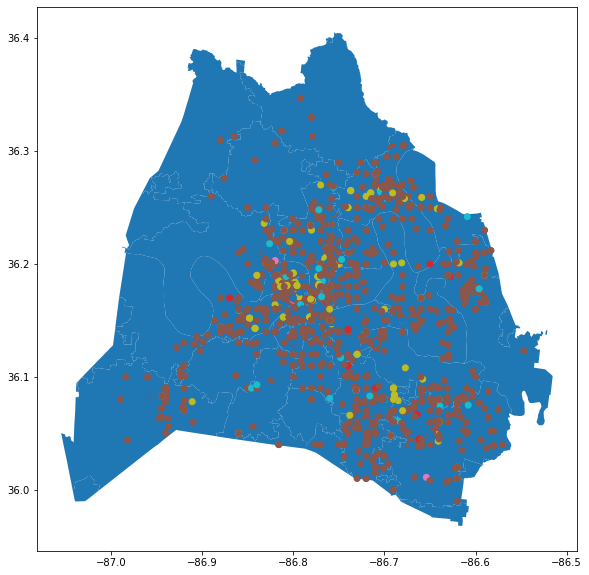

In [42]:
ax_after = zipcodes.plot(figsize = (10,10))
after_geo.plot( ax = ax_after, column = 'Victim Description')
plt.show();

In [43]:
after_geo.head(2)
after_geo.dtypes

Primary Key                            object
Incident Number                         int64
Report Type                            object
Report Type Description                object
Incident Status Code                   object
Incident Status Description            object
Investigation Status                   object
Incident Occurred              datetime64[ns]
Incident Reported                      object
Incident Location                      object
Latitude                              float64
Longitude                             float64
ZIP Code                              float64
RPA                                   float64
Zone                                  float64
Location Code                         float64
Location Description                   object
Offense Number                        float64
Offense NIBRS                          object
Offense Description                    object
Weapon Primary                         object
Weapon Description                

In [44]:
after_geo['Weapon Description'].value_counts()
after_geo.shape()

TypeError: 'tuple' object is not callable

In [ ]:
before_geo['Weapon Description'].value_counts()

In [45]:
after_geo.shape

(1640, 35)

In [46]:
before_geo.shape

(1761, 35)